In [1]:
import torch.nn as nn
import torch

In [2]:
class MaskMaker(nn.Module):
    def __init__(self):
        super(MaskMaker, self).__init__()

        self.conv1 = nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(16)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(32)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.bn3 = nn.BatchNorm2d(64)
        self.conv4 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.bn4 = nn.BatchNorm2d(128)
        self.conv5 = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1)
        self.bn5 = nn.BatchNorm2d(256)
        self.conv6 = nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1)
        self.bn6 = nn.BatchNorm2d(512)
        
        self.fc = nn.Linear(512*2*2, 150*150)
        
    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)))
        x = F.max_pool2d(x, 2)
        x = F.relu(self.bn2(self.conv2(x)))
        x = F.max_pool2d(x, 2)
        x = F.relu(self.bn3(self.conv3(x)))
        x = F.max_pool2d(x, 2)
        x = F.relu(self.bn4(self.conv4(x)))
        x = F.max_pool2d(x, 2)
        x = F.relu(self.bn5(self.conv5(x)))
        x = F.max_pool2d(x, 2)
        x = F.relu(self.bn6(self.conv6(x)))
        x = F.max_pool2d(x, 2)
        
        x = x.view(-1, 512*2*2)
        x = F.sigmoid(self.fc(x))
        x = x.view(-1, 1, 150, 150)
        return x.T


In [3]:
import pickle

with open('camo_model_cnn.pkl', 'rb') as f:
    # Load the pickled data into a Python object
    data = pickle.load(f)

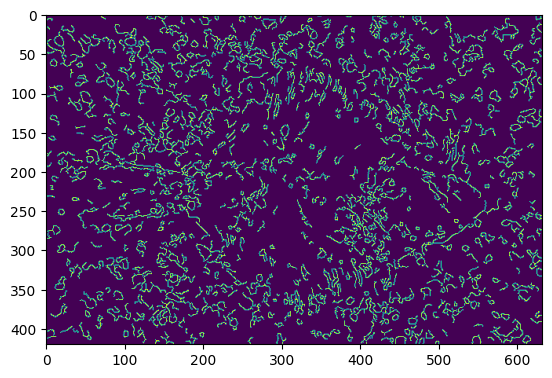

In [24]:
import cv2
#img1 = mpimg.imread('./CAMO-V.1.0/Images/Test/camourflage_00012.jpg')
img1 = Image.open('./CAMO-V.1.0/Images/Train/camourflage_000.jpg').convert('L')
og_img = img1
img1 = np.array(img1)
plt.imshow(img1)
img_blur = cv2.GaussianBlur(img1, (5, 5), 0)
edges = cv2.Canny(img_blur, threshold1=100, threshold2=200)
plt.imshow(edges)

plt.imsave('./temp/img.jpg',edges,cmap='gray')

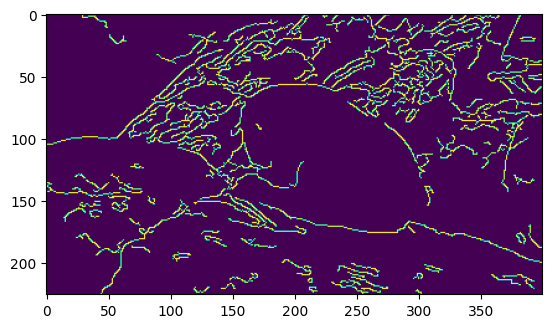

In [61]:
import cv2
#img1 = mpimg.imread('./CAMO-V.1.0/Images/Test/camourflage_00012.jpg')
img2 = Image.open('./CAMO-V.1.0/Images/Train/camourflage_00115.jpg').convert('L')
og_img2 = img2
img2 = np.array(img2)
plt.imshow(img2)
img_blur = cv2.GaussianBlur(img2, (5, 5), 0)
edges = cv2.Canny(img_blur, threshold1=100, threshold2=200)
plt.imshow(edges)

plt.imsave('./temp/img2.jpg',edges,cmap='gray')

torch.Size([1, 1, 150, 150])
torch.Size([1, 1, 150, 150])


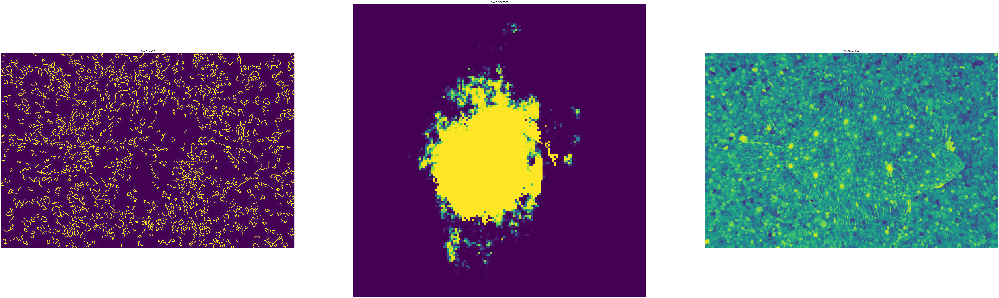

In [62]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
import torchvision.transforms as transforms
import torch.nn.functional as F
import numpy as np


# # load images
# img1 = mpimg.imread('./CAMO-V.1.0/Canny_Filtered_images/camourflage_00001.jpg')
# #img2 = mpimg.imread('./CAMO-V.1.0/new_masks/camourflage_00001.jpg')
img1 = Image.open('./temp/img.jpg').convert('L')
img2 = Image.open('./temp/img2.jpg').convert('L')


#make prediction
transform = transforms.Compose([transforms.Resize((150,150)), transforms.ToTensor()])

#to PIL image
# print(np.shape(img1.astype('uint8')))
# img1 = Image.fromarray(img1, mode='L')

i = transform(img1)
i = i.unsqueeze(0)
i= i.to('cuda')
print(np.shape(i))

pred = data(i)

temp = pred.detach()
img = temp.cpu()
pred = img

i = transform(img2)
i = i.unsqueeze(0)
i= i.to('cuda')
print(np.shape(i))

pred2 = data(i)

temp = pred2.detach()
img = temp.cpu()
pred2 = img


# create subplots
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(100,100))

# display images on subplots
ax1.imshow(img1)
ax1.set_title('CAMO IMAGE')
ax1.axis('off')

ax2.imshow(pred.squeeze())
ax2.set_title('CAMO OBJ EDGE')
ax2.axis('off')

ax3.imshow(og_img)
ax3.set_title('ORIGINAL IMG')
ax3.axis('off')

ax4.imshow(img2)
ax4.set_title('CAMO IMAGE')
ax4.axis('off')

ax5.imshow(pred2.squeeze())
ax5.set_title('CAMO OBJ EDGE')
ax5.axis('off')

ax6.imshow(og_img2)
ax6.set_title('ORIGINAL IMG')
ax6.axis('off')

# show the plot
plt.show()

(-0.5, 399.5, 269.5, -0.5)

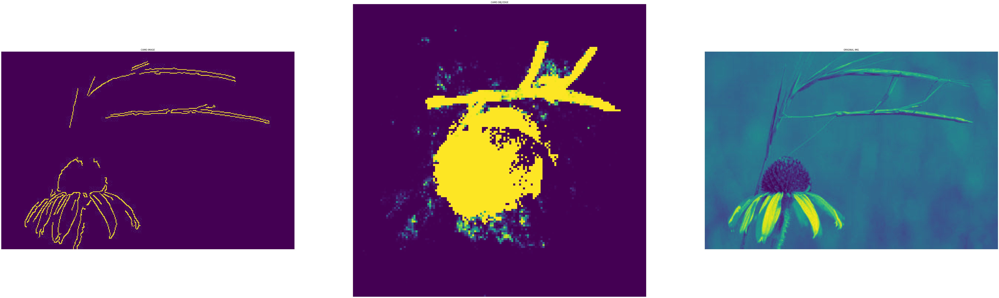

In [54]:
fig, (ax4, ax5, ax6) = plt.subplots(1, 3, figsize=(100,100))

ax4.imshow(img2)
ax4.set_title('CAMO IMAGE')
ax4.axis('off')

ax5.imshow(pred2.squeeze())
ax5.set_title('CAMO OBJ EDGE')
ax5.axis('off')

ax6.imshow(og_img2)
ax6.set_title('ORIGINAL IMG')
ax6.axis('off')

(-0.5, 399.5, 225.5, -0.5)

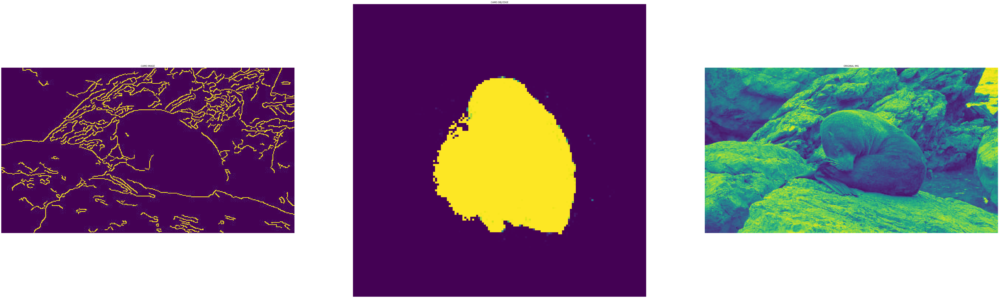

In [63]:
fig, (ax4, ax5, ax6) = plt.subplots(1, 3, figsize=(100,100))

ax4.imshow(img2)
ax4.set_title('CAMO IMAGE')
ax4.axis('off')

ax5.imshow(pred2.squeeze())
ax5.set_title('CAMO OBJ EDGE')
ax5.axis('off')

ax6.imshow(og_img2)
ax6.set_title('ORIGINAL IMG')
ax6.axis('off')

(-0.5, 939.5, 627.5, -0.5)

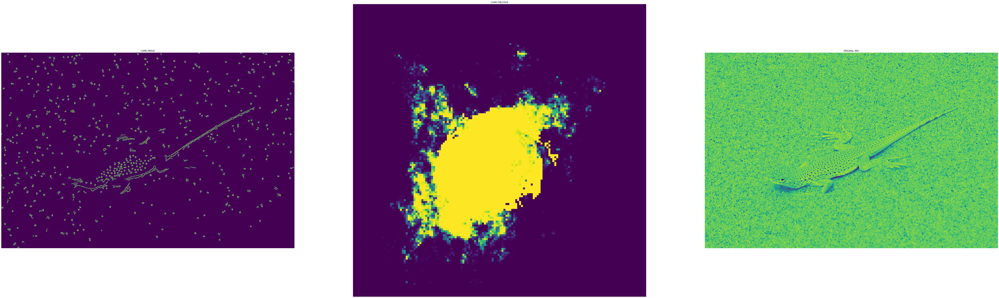

In [57]:
fig, (ax4, ax5, ax6) = plt.subplots(1, 3, figsize=(100,100))

ax4.imshow(img2)
ax4.set_title('CAMO IMAGE')
ax4.axis('off')

ax5.imshow(pred2.squeeze())
ax5.set_title('CAMO OBJ EDGE')
ax5.axis('off')

ax6.imshow(og_img2)
ax6.set_title('ORIGINAL IMG')
ax6.axis('off')

(-0.5, 599.5, 398.5, -0.5)

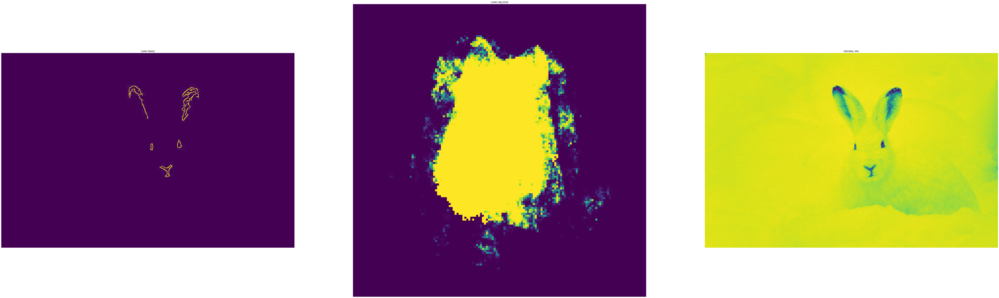

In [60]:
fig, (ax4, ax5, ax6) = plt.subplots(1, 3, figsize=(100,100))

ax4.imshow(img2)
ax4.set_title('CAMO IMAGE')
ax4.axis('off')

ax5.imshow(pred2.squeeze())
ax5.set_title('CAMO OBJ EDGE')
ax5.axis('off')

ax6.imshow(og_img2)
ax6.set_title('ORIGINAL IMG')
ax6.axis('off')